Testing py script.

In [1]:
import sys

sys.path.insert(1, "/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark")

In [2]:
import argparse
import logging
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
from matplotlib.pyplot import rc_context

from cellseg_benchmark._constants import cell_type_colors
from cellseg_benchmark._markers import (
    contamination_markers,
    selected_EC_subtypes,
)
from cellseg_benchmark.adata_utils import (
    clean_pca_umap,
    integration_harmony,
    normalize_counts,
    pca_umap_single,
    plot_integration_comparison,
)
from cellseg_benchmark.cell_annotation_utils import (
    annotate_cells_by_score,
    flag_contamination,
    score_cell_types,
)

In [3]:
# import importlib
# import cellseg_benchmark.adata_utils
# importlib.reload(cellseg_benchmark.adata_utils)

In [4]:
today = datetime.today().strftime("%Y%m%d")

In [54]:
# Logger Setup
logger = logging.getLogger("vascular_subtyping")
logger.setLevel(logging.INFO)
if not logger.handlers:
    handler = logging.StreamHandler()
    handler.setFormatter(logging.Formatter("%(asctime)s [%(levelname)s]: %(message)s"))
    logger.addHandler(handler)

In [6]:
# CLI arguments
parser = argparse.ArgumentParser(description="Identify EC zonation subtypes.")
parser.add_argument("cohort")
parser.add_argument("seg_method")
parser.add_argument(
    "--base-path",
    type=Path,
    default=Path("/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark"),
)
parser.add_argument(
    "--cell-type-col",
    default="cell_type_revised",
)
parser.add_argument(
    "--condition-col",
    default="condition",
)
parser.add_argument(
    "--batch-key",
    default="slide",
)
parser.add_argument(
    "--input-filename",
    default="adata_integrated.h5ad.gz",
)
# args = parser.parse_args()

_StoreAction(option_strings=['--input-filename'], dest='input_filename', nargs=None, const=None, default='adata_integrated.h5ad.gz', type=None, choices=None, required=False, help=None, metavar=None)

In [7]:
# Simulate CLI args in Jupyter
args = parser.parse_args(["foxf2", "Cellpose_1_nuclei_model"])
args = parser.parse_args(["foxf2", "Cellpose_1_Merlin"])
print(args.cohort)
print(args.seg_method)

foxf2
Cellpose_1_Merlin


In [8]:
logger.info("Starting vascular subtyping for %s / %s", args.cohort, args.seg_method)

2025-11-25 19:30:47,617 [INFO]: Starting vascular subtyping for foxf2 / Cellpose_1_Merlin


In [12]:
# Paths
method_path = args.base_path / "analysis" / args.cohort / args.seg_method
adatas_path = method_path / "adatas"
plot_path = method_path / "plots" / "subtyping-vascular"
for p in [plot_path, plot_path / "ecs-only", plot_path / "spatial", adatas_path]:
    p.mkdir(parents=True, exist_ok=True)

In [14]:
logger.info("Load adata...")
adata = sc.read_h5ad(adatas_path / args.input_filename)
cell_type_col = args.cell_type_col
if cell_type_col not in adata.obs.columns:
    raise KeyError(f"'{cell_type_col}' not in adata.obs")
adata.obs[cell_type_col] = pd.Categorical(
    adata.obs[cell_type_col], categories=list(cell_type_colors.keys())
).remove_unused_categories()
adata.uns[f"{cell_type_col}_colors"] = [
    cell_type_colors[c] for c in adata.obs[cell_type_col].cat.categories
]

2025-11-25 19:32:12,500 [INFO]: Load adata...


In [16]:
logger.info("Subset vascular cells...")
vascular_types = ["ECs", "SMCs", "Pericytes", "VLMCs", "BAMs"]
sub = adata[adata.obs[cell_type_col].isin(vascular_types)].copy()
del adata

2025-11-25 19:34:02,804 [INFO]: Subset vascular cells...


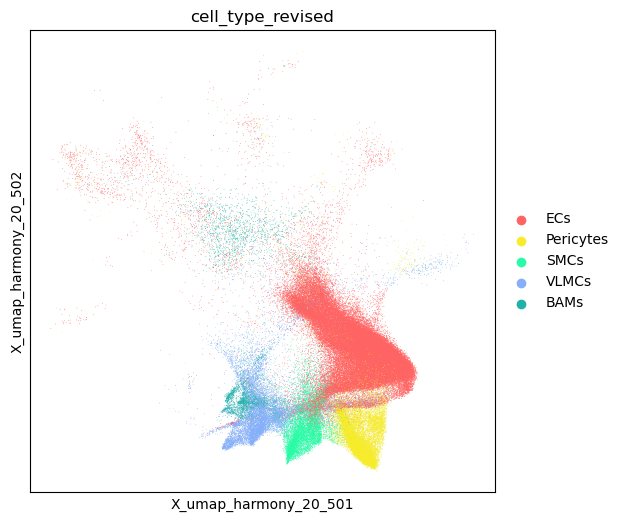

In [18]:
# pre contamination filtering
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(sub, basis="X_umap_harmony_20_50", color=cell_type_col)
    plt.show()

In [ ]:
# Flag contamination
logger.info("Filter out contaminated cells...")
sub = flag_contamination(
    sub,
    contamination_markers,
    layer="volume_log1p_norm",
    absolute_min=1,
    z_threshold=2,
    logger=logger,
)

with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        sub,
        basis="X_umap_harmony_20_50",
        color=[
            "contaminated",
            "contaminated_Neuronal",
            "contaminated_Oligodendrocytes",
            "contaminated_Astrocytes",
            "contaminated_Immune",
        ],
        size=50000 / sub.shape[0],
        show=False,
    )
    plt.savefig(
        plot_path / "UMAP_cell_type_contaminations.png", dpi=150, bbox_inches="tight"
    )
    plt.show()

sub = sub[~sub.obs["contaminated"]].copy()

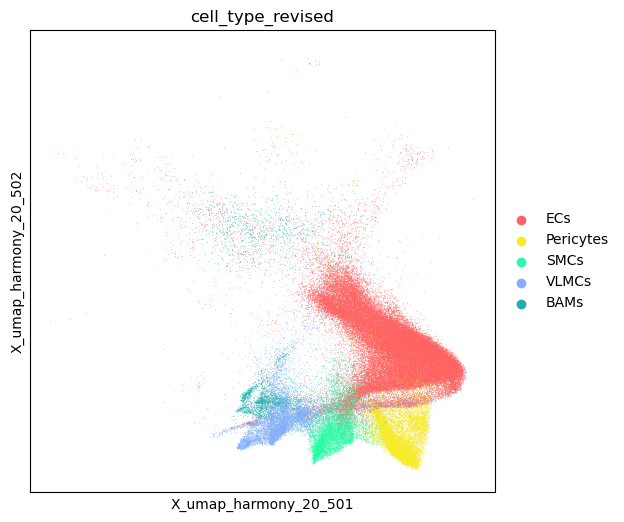

In [23]:
# post contamination filtering
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(sub, basis="X_umap_harmony_20_50", color=cell_type_col, show=False)
    plt.savefig(plot_path / "UMAP_integrated_subset.png", dpi=200, bbox_inches="tight")
    plt.show()

In [ ]:
! mamba install bioconda::harmonypy -y

In [24]:
logger.info("Re-process vascular subset...")
sub = clean_pca_umap(sub, logger=logger)
sub.X = sub.layers["counts"]
assert np.issubdtype(sub.X.dtype, np.integer)
sub = normalize_counts(  # do not trim cells again in subset
    sub, save_path=None, seg_method=args.seg_method, trim_outliers=False, logger=logger
)
sub = pca_umap_single(sub, n_neighbors=10, n_pcs=20, save_path=None, logger=logger)
sub = integration_harmony(
    sub,
    batch_key=args.batch_key,
    n_neighbors=10,
    n_pcs=20,
    save_path=None,
    logger=logger,
)

2025-11-25 19:38:27,391 [INFO]: Re-process vascular subset...
2025-11-25 19:38:27,394 [INFO]: Deleted adata.uns['X_umap_20_50']
2025-11-25 19:38:27,395 [INFO]: Deleted adata.uns['X_umap_harmony_20_50']
2025-11-25 19:38:27,396 [INFO]: Deleted adata.uns['X_umap_harmony_20_50_3d']
2025-11-25 19:38:27,397 [INFO]: Deleted adata.uns['neighbors_harmony_20_50']
2025-11-25 19:38:27,398 [INFO]: Deleted adata.uns['pca']
2025-11-25 19:38:27,651 [INFO]: Deleted adata.obsm['X_pca']
2025-11-25 19:38:27,776 [INFO]: Deleted adata.obsm['X_pca_harmony']
2025-11-25 19:38:27,903 [INFO]: Deleted adata.obsm['X_umap_20_50']
2025-11-25 19:38:28,030 [INFO]: Deleted adata.obsm['X_umap_harmony_20_50']
2025-11-25 19:38:28,157 [INFO]: Deleted adata.obsm['X_umap_harmony_20_50_3d']
2025-11-25 19:38:28,159 [INFO]: Deleted adata.varm['PCs']
2025-11-25 19:38:28,163 [INFO]: Deleted adata.obsp['neighbors_harmony_20_50_connectivities']
2025-11-25 19:38:28,165 [INFO]: Deleted adata.obsp['neighbors_harmony_20_50_distances']


In [25]:
logger.info("Score EC zonation subtypes...")
# Step 1: score marker genes
sub = score_cell_types(
    sub, selected_EC_subtypes, top_n_genes=10, layer="volume_log1p_norm"
)
# Step 2: assign each cell by max scoring subtype
sub = annotate_cells_by_score(
    sub, selected_EC_subtypes, out_col="ec_zonation", score_threshold=0.15
)
sub.obs["ec_zonation"] = pd.Categorical(
    sub.obs["ec_zonation"], categories=list(cell_type_colors.keys())
).remove_unused_categories()
sub.uns["ec_zonation_colors"] = [
    cell_type_colors[ct] for ct in sub.obs["ec_zonation"].cat.categories
]

2025-11-25 19:48:51,849 [INFO]: Score EC zonation subtypes...


In [26]:
# counts = sub.obs['ec_zonation'].value_counts()
# logger.info(f"Value counts: {counts}")

In [27]:
logger.info("Re-process EC-only subset...")
ec = sub[sub.obs["ec_zonation"].isin(["aECs", "capECs", "vECs"])].copy()
logger.info(f"Cells removed (non-ECs): {sub.shape[0] - ec.shape[0]}")
logger.info(f"Remaining ECs: {ec.shape[0]}")

2025-11-25 19:48:53,704 [INFO]: Re-process EC-only subset...
2025-11-25 19:48:55,105 [INFO]: Cells removed (non-ECs): 54471
2025-11-25 19:48:55,106 [INFO]: Remaining ECs: 41677


In [28]:
ec = clean_pca_umap(ec, logger=logger)
ec.X = ec.layers["counts"]
assert np.issubdtype(ec.X.dtype, np.integer)
ec = normalize_counts(  # do not trim cells again in subset
    ec, save_path=None, seg_method=args.seg_method, trim_outliers=False, logger=logger
)
ec = pca_umap_single(ec, n_neighbors=10, n_pcs=20, save_path=None, logger=logger)
ec = integration_harmony(
    ec,
    batch_key=args.batch_key,
    n_neighbors=10,
    n_pcs=20,
    save_path=None,
    logger=logger,
)

2025-11-25 19:48:56,997 [INFO]: Deleted adata.uns['pca']
2025-11-25 19:48:56,999 [INFO]: Deleted adata.uns['X_umap_10_20']
2025-11-25 19:48:57,001 [INFO]: Deleted adata.uns['neighbors_harmony_10_20']
2025-11-25 19:48:57,002 [INFO]: Deleted adata.uns['X_umap_harmony_10_20']
2025-11-25 19:48:57,003 [INFO]: Deleted adata.uns['X_umap_harmony_10_20_3d']
2025-11-25 19:48:57,139 [INFO]: Deleted adata.obsm['X_pca']
2025-11-25 19:48:57,199 [INFO]: Deleted adata.obsm['X_umap_10_20']
2025-11-25 19:48:57,254 [INFO]: Deleted adata.obsm['X_pca_harmony']
2025-11-25 19:48:57,309 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20']
2025-11-25 19:48:57,364 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20_3d']
2025-11-25 19:48:57,365 [INFO]: Deleted adata.varm['PCs']
2025-11-25 19:48:57,367 [INFO]: Deleted adata.obsp['neighbors_harmony_10_20_distances']
2025-11-25 19:48:57,368 [INFO]: Deleted adata.obsp['neighbors_harmony_10_20_connectivities']
2025-11-25 19:48:57,370 [INFO]: Deleted adata.layers['volume_n

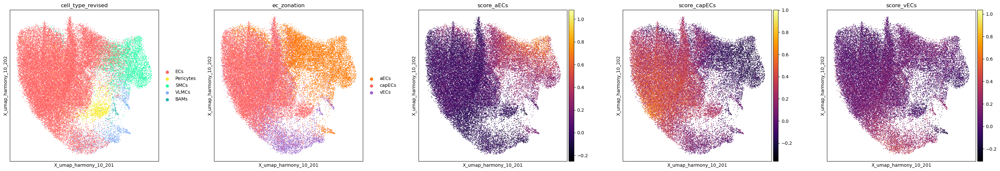

In [30]:
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        ec,
        basis="X_umap_harmony_10_20",
        color=[
            cell_type_col,
            "ec_zonation",
            "score_aECs",
            "score_capECs",
            "score_vECs",
        ],
        cmap="inferno",
        ncols=5,
        size=320000 / ec.shape[0],
        show=False,
        wspace=0.25,
    )
    plt.savefig(plot_path / "ecs-only" / "UMAP_ECs.png", dpi=150, bbox_inches="tight")
    plt.show()

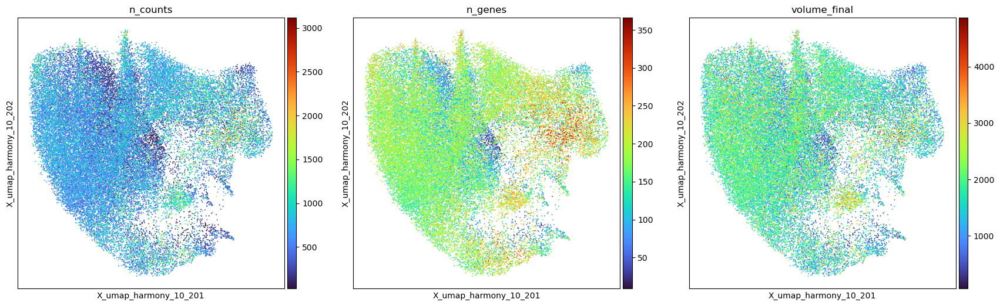

In [33]:
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        ec,
        basis="X_umap_harmony_10_20",
        color=["n_counts", "n_genes", "volume_final"],
        size=320000 / ec.shape[0],
        cmap="turbo",
        show=False,
    )
    plt.savefig(
        plot_path / "ecs-only" / "UMAP_ECs_metadata.png", dpi=100, bbox_inches="tight"
    )
    plt.show()

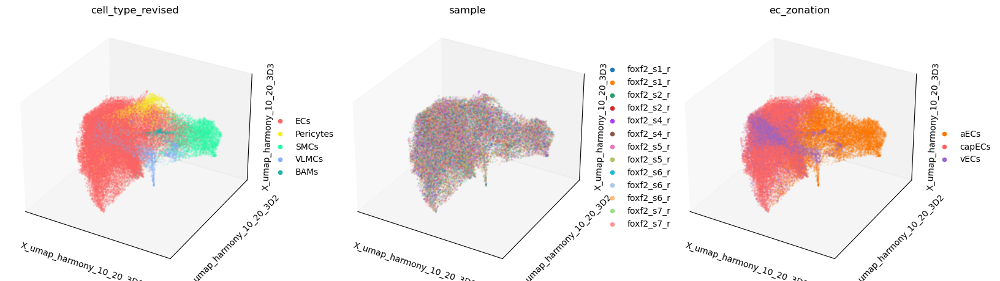

In [31]:
# run 3D UMAP (computation affects 2D components, therefore save separately)
sc.pp.neighbors(ec, n_neighbors=10, n_pcs=20)
sc.tl.umap(
    ec,
    neighbors_key="neighbors_harmony_10_20",
    key_added="X_umap_harmony_10_20_3D",
    n_components=3,
)
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        ec,
        basis="X_umap_harmony_10_20_3D",
        color=[cell_type_col, "sample", "ec_zonation"],
        alpha=0.2,
        wspace=0.1,
        projection="3d",
        show=False,
    )
    plt.savefig(
        plot_path / "ecs-only" / "UMAP_ECs_3D.png", dpi=150, bbox_inches="tight"
    )
    plt.show()

In [36]:
# alternative embeddings

In [ ]:
! mamba install bioconda::trimap -y
! pip install phate # bioconda-phate requires older python

TRIMAP(n_inliers=10, n_outliers=5, n_random=5, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=500.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 41677 points with dimension 50
pre-processing
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 1856.138, Violated triplets: 0.0810
Iteration:  200, Loss: 1788.212, Violated triplets: 0.0780
Iteration:  300, Loss: 1748.455, Violated triplets: 0.0763
Iteration:  400, Loss: 1726.898, Violated triplets: 0.0753
Elapsed time: 0:00:58.134625


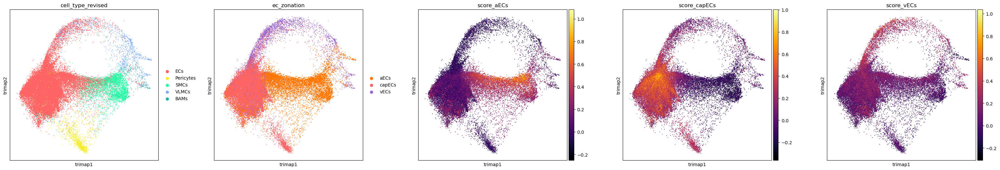

In [32]:
sc.external.tl.trimap(ec)
with rc_context({"figure.figsize": (6, 6)}):
    sc.external.pl.trimap(
        ec,
        ncols=5,
        color=[
            cell_type_col,
            "ec_zonation",
            "score_aECs",
            "score_capECs",
            "score_vECs",
        ],
        cmap="inferno",
        size=320000 / ec.shape[0],
        show=False,
        wspace=0.25,
    )
    plt.savefig(plot_path / "ecs-only" / "TRIMAP_ECs.png", dpi=150, bbox_inches="tight")
    plt.show()

/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:208: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:212: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


    SGD-MDS may not have converged: stress changed by -2.2% in final iterations. Consider increasing n_iter or adjusting learning_rate.


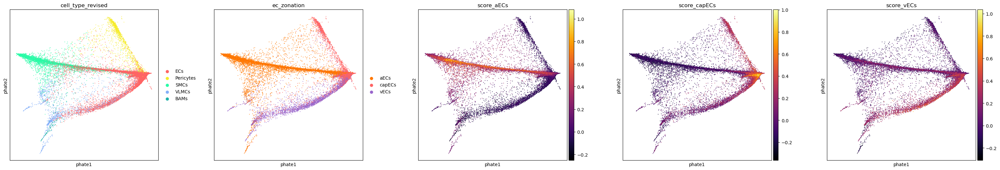

In [34]:
sc.external.tl.phate(ec)
with rc_context({"figure.figsize": (6, 6)}):
    sc.external.pl.phate(
        ec,
        ncols=5,
        color=[
            cell_type_col,
            "ec_zonation",
            "score_aECs",
            "score_capECs",
            "score_vECs",
        ],
        cmap="inferno",
        size=320000 / ec.shape[0],
        show=False,
        wspace=0.25,
    )
    plt.savefig(plot_path / "ecs-only" / "PHATE_ECs.png", dpi=150, bbox_inches="tight")
    plt.show()

In [35]:
# %%time
# sc.tl.tsne(ec)
# with rc_context({"figure.figsize": (6,6)}):
#     sc.pl.tsne(ec, ncols=5,
#                color=[cell_type_col, "ec_zonation", "score_aECs", "score_capECs", "score_vECs"], cmap="inferno",
#                size=320000 / ec.shape[0],
#                show=False, wspace=0.25)
#     #plt.savefig(
#     #    plot_path / "ecs-only" / "TSNE_ECs.png", dpi=150, bbox_inches="tight"
#     #)
#     plt.show()

In [36]:
#! mamba install bioconda::palantir -y

In [37]:
# %%time
## Palantir
# sc.external.tl.palantir(ec_adata)

In [38]:
# sc.tl.tsne(ec_adata, n_pcs=2, use_rep="X_palantir_multiscale", perplexity=150)
# sc.pl.tsne(ec_adata, color=["sample", "ec_zonation", cell_type_col])

In [39]:
## start cell can be defined manually, see https://scanpy.readthedocs.io/en/latest/external/generated/scanpy.external.tl.palantir.html

In [41]:
logger.info("Summaries by condition...")
cond = args.condition_col
if cond in ec.obs.columns:
    df_counts = pd.crosstab(ec.obs[cond], ec.obs["ec_zonation"], margins=True)
    df_frac = (
        pd.crosstab(
            ec.obs[cond], ec.obs["ec_zonation"], normalize="index", margins=True
        )
        .mul(100)
        .round(1)
    )
    df_frac_sample = (
        pd.crosstab(
            [ec.obs[cond], ec.obs["sample"]],
            ec.obs["ec_zonation"],
            normalize="index",
            margins=True,
        )
        .mul(100)
        .round(1)
    )
    logger.info("EC subtype counts:\n%s", df_counts)
    logger.info("EC subtype fractions:\n%s", df_frac)
    logger.info("EC subtype fractions (per sample):\n%s", df_frac_sample)

2025-11-25 19:57:43,444 [INFO]: Summaries by condition...
2025-11-25 19:57:43,677 [INFO]: EC subtype counts:
ec_zonation   aECs  capECs  vECs    All
genotype                               
ECKO          2559    4729  1025   8313
GLKO          2338    6375  1247   9960
PCKO          2888    6534  1391  10813
WT            3291    7918  1382  12591
All          11076   25556  5045  41677
2025-11-25 19:57:43,682 [INFO]: EC subtype fractions:
ec_zonation  aECs  capECs  vECs
genotype                       
ECKO         30.8    56.9  12.3
GLKO         23.5    64.0  12.5
PCKO         26.7    60.4  12.9
WT           26.1    62.9  11.0
All          26.6    61.3  12.1
2025-11-25 19:57:43,686 [INFO]: EC subtype fractions (per sample):
ec_zonation           aECs  capECs  vECs
genotype sample                         
ECKO     foxf2_s1_r0  29.4    58.3  12.3
         foxf2_s4_r1  31.3    58.3  10.3
         foxf2_s5_r1  31.8    53.9  14.3
GLKO     foxf2_s6_r0  31.5    58.5  10.0
         foxf2_s6_r1

In [42]:
logger.info("Merge EC zonation subtypes back into vascular set...")
merged = sub.copy()
if "ec_zonation" in merged.obs.columns:
    merged.obs = merged.obs.drop(columns="ec_zonation")

merged.obs = merged.obs.merge(
    ec.obs[["ec_zonation"]], left_index=True, right_index=True, how="left"
)
merged.obs["cell_type_incl_zonation"] = (
    merged.obs["ec_zonation"]
    .astype("object")
    .fillna(merged.obs[cell_type_col].astype("object"))
)

# set "otherECs" for specific cell types without ec annotation. these were previously removed as contamination.
missed_ECs_mask = merged.obs["ec_zonation"].isna() & merged.obs[cell_type_col].isin(
    ["ECs"]
)
merged.obs.loc[missed_ECs_mask, "cell_type_incl_zonation"] = "otherECs"

merged.obs["cell_type_incl_zonation"] = merged.obs["cell_type_incl_zonation"].astype(
    "category"
)
merged.obs.drop(columns="ec_zonation", inplace=True)

# Set ordered categories and color map
merged.obs["cell_type_incl_zonation"] = pd.Categorical(
    merged.obs["cell_type_incl_zonation"], categories=list(cell_type_colors.keys())
).remove_unused_categories()

merged.uns["cell_type_incl_zonation_colors"] = [
    cell_type_colors[ct] for ct in merged.obs["cell_type_incl_zonation"].cat.categories
]

2025-11-25 19:58:21,231 [INFO]: Merge EC zonation subtypes back into vascular set...


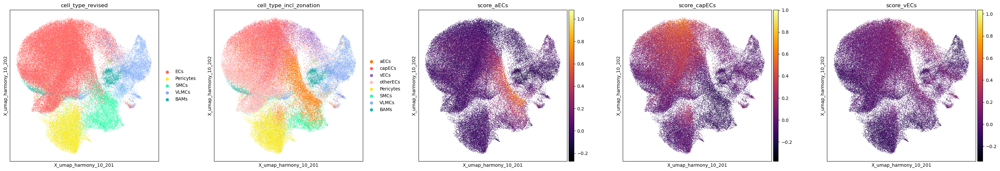

In [43]:
with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        merged,
        basis="X_umap_harmony_10_20",
        color=[
            cell_type_col,
            "cell_type_incl_zonation",
            "score_aECs",
            "score_capECs",
            "score_vECs",
        ],
        cmap="inferno",
        size=320000 / merged.shape[0],
        ncols=5,
        show=False,
        wspace=0.25,
    )
    plt.savefig(
        plot_path / "UMAP_integrated_EC_scoring.png", dpi=150, bbox_inches="tight"
    )
    plt.show()

In [49]:
logger.info(f"Exporting spatial plots to: {plot_path / 'spatial'}...")
if "sample" in merged.obs.columns:
    for s in merged.obs["sample"].unique():
        with rc_context({"figure.figsize": (10, 10)}):
            sc.pl.embedding(
                merged[merged.obs["sample"] == s],
                basis="spatial_microns",
                color="cell_type_incl_zonation",
                size=9,
                show=False,
            )
            plt.savefig(plot_path / "spatial" / f"Spatial_{s}.png", dpi=500)
            plt.close()

2025-11-25 20:00:38,291 [INFO]: Exporting spatial plots to: /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/analysis/foxf2/Cellpose_1_Merlin/plots/subtyping-vascular/spatial...


In [53]:
out = adatas_path / "adata_vascular_subset.h5ad.gz"
logger.info("Saving vascular subset to %s", out)
if "fov" in merged.obs.columns:
    merged.obs["fov"] = merged.obs["fov"].astype(str)
merged.write(out, compression="gzip")
logger.info("Done.")

2025-11-25 20:01:55,983 [INFO]: Saving to /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/analysis/foxf2/Cellpose_1_Merlin/adatas/adata_vascular_subset.h5ad.gz
2025-11-25 20:02:28,136 [INFO]: Done.


In [27]:
###################################
# alternative (not in script)
# subset gene space to selected markers (vascular, cell cycle)

In [28]:
from cellseg_benchmark import _markers

supertype_markers = _markers.cell_supertypes_merfish_panel_500_mouse_brain
cell_cycle_genes = [g for genes in _markers.cell_cycle_genes.values() for g in genes]

In [29]:
sub_adata = sub_adata[
    :, sub_adata.var_names.isin(supertype_markers["Vascular"] + cell_cycle_genes)
].copy()
# adata = adata[:, adata.var_names.isin(supertype_markers["Vascular"]+supertype_markers["Immune"]+cell_cycle_genes)].copy()

In [30]:
sub_adata.shape

(62290, 192)

In [31]:
# Re-process subset
logger.info(
    "Re-processing vascular subset using selected markers (vascular and cell cycle)..."
)
sub_adata = clean_pca_umap(sub_adata, logger=logger)
sub_adata.X = sub_adata.layers["counts"]
assert np.issubdtype(sub_adata.X.dtype, np.integer)

sub_adata = normalize_counts(
    sub_adata,
    save_path=plot_path,
    seg_method=args.seg_method,
    trim_outliers=False,
    logger=logger,
)
sub_adata = pca_umap_single(
    sub_adata, n_neighbors=10, n_pcs=20, save_path=None, logger=logger
)
sub_adata = integration_harmony(
    sub_adata,
    batch_key="slide",
    n_neighbors=10,
    n_pcs=20,
    save_path=None,
    logger=logger,
)

2025-11-03 15:22:43,361 [INFO]: Re-processing vascular subset using selected markers (vascular and cell cycle)...
2025-11-03 15:22:43,363 [INFO]: Deleted adata.uns['pca']
2025-11-03 15:22:43,365 [INFO]: Deleted adata.uns['X_umap_10_20']
2025-11-03 15:22:43,365 [INFO]: Deleted adata.uns['neighbors_harmony_10_20']
2025-11-03 15:22:43,366 [INFO]: Deleted adata.uns['X_umap_harmony_10_20']
2025-11-03 15:22:43,367 [INFO]: Deleted adata.uns['X_umap_harmony_10_20_3d']
2025-11-03 15:22:43,439 [INFO]: Deleted adata.obsm['X_pca']
2025-11-03 15:22:43,472 [INFO]: Deleted adata.obsm['X_umap_10_20']
2025-11-03 15:22:43,505 [INFO]: Deleted adata.obsm['X_pca_harmony']
2025-11-03 15:22:43,538 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20']
2025-11-03 15:22:43,570 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20_3d']
2025-11-03 15:22:43,571 [INFO]: Deleted adata.varm['PCs']
2025-11-03 15:22:43,573 [INFO]: Deleted adata.obsp['neighbors_harmony_10_20_distances']
2025-11-03 15:22:43,574 [INFO]: Deleted a

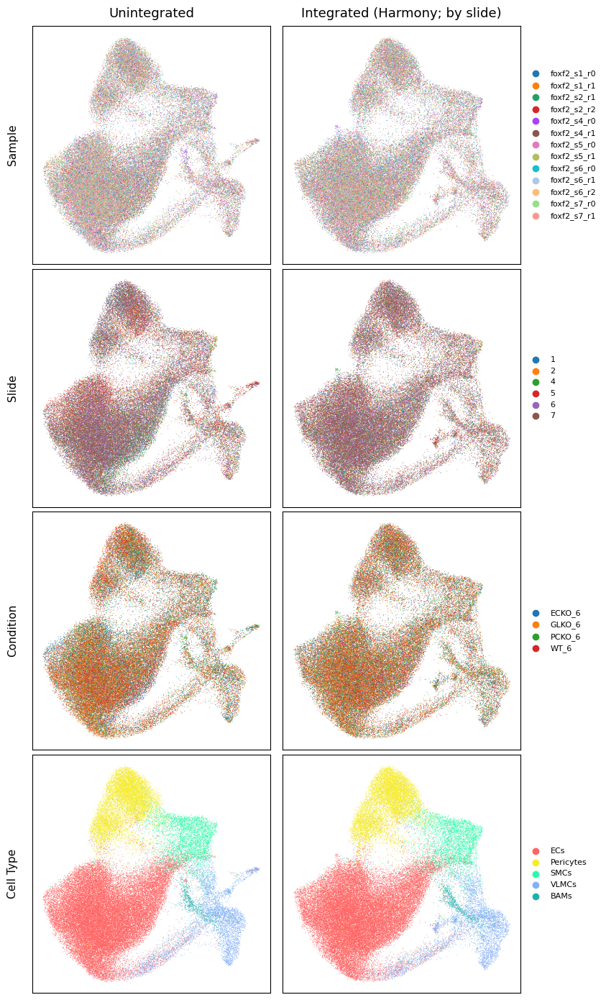

In [32]:
plot_integration_comparison(
    sub_adata,
    save_path=None,
    umap_key="X_umap_harmony_10_20",
    batch_key="slide",
    point_size_factor=100000,
)

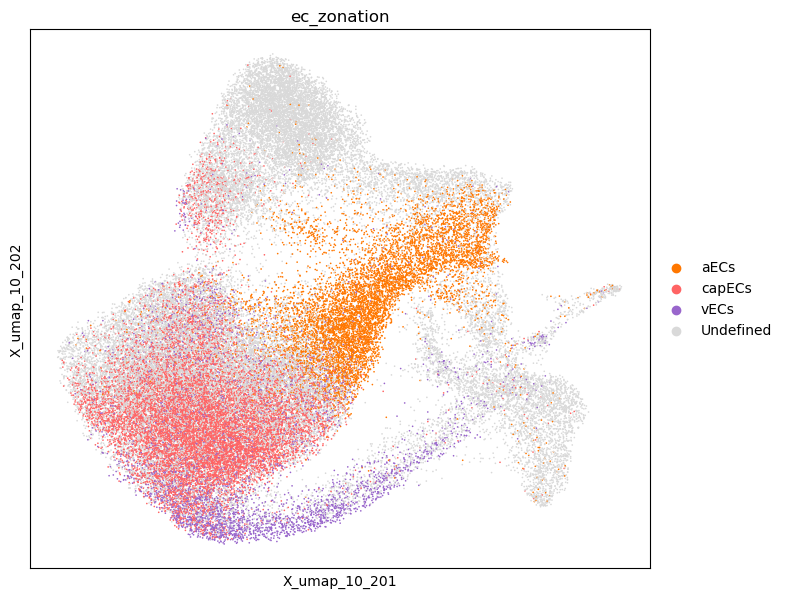

In [33]:
with rc_context({"figure.figsize": (8, 7)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_10_20",
        color="ec_zonation",
        size=150000 / ec_adata.shape[0],
        show=False,
    )
    # plt.savefig(
    #    plot_path / "ecs-only" / "UMAP_reprocessed_ECs.png", dpi=150, bbox_inches="tight"
    # )
    plt.show()